# Writing datasets to HDF5 databases

Uses the data that was converted to right format and moved to right folders in the previous notebook.

**Pipeline**:
1. Add mirror padding to images and corresponding masks
2. Patch images and corresponding masks to arrays of patches. Each patch is 'patch_size'x'patch_size' (config.py).
3. Do rigid augmentations to some of the patches (augmentations.py)
4. Crop patches to final network 'input_size' (config.py)
5. save patches to .pytable (hdf5) file

**Note**: If dataset is **pannuke** no patching, augmenting or cropping is done. (Augmentations maybe in the future)


In [1]:
import sys
sys.path.append("..")
sys.path.append("../utils")
from data_writer import PatchWriter, visualize_db_patches
from config import conf

# Kumar

In [2]:
conf["dataset"]["args"]["dataset"] = "kumar"
writer_kumar = PatchWriter.from_conf(conf)

# check an example on how the patches look for a single image
# writer_kumar.viz_patches_example(index=3, img_type="overlay", phase="test")

In [3]:
writer_kumar.write_dbs()

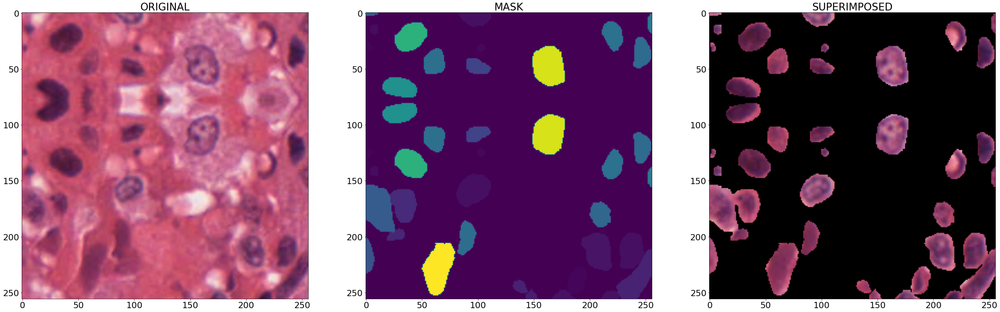

array([  0,   5,   7,   9,  13,  16,  17,  18,  19,  22,  33,  37,  38,
        44,  48,  82, 105, 118, 134, 142, 146, 149, 151, 167, 205, 260,
       381, 405], dtype=int16)

In [4]:
# Visualize masks and image patches for checking correctness of db
files = [file for file in writer_kumar.database_dir.iterdir()]
visualize_db_patches(files[1].as_posix(), index=14)

# Consep

In [5]:
conf["dataset"]["args"]["dataset"] = "consep"
writer_consep = PatchWriter.from_conf(conf)
# writer_consep.viz_patches_example(index=3, img_type="mask", phase="train")

In [6]:
writer_consep.write_dbs()

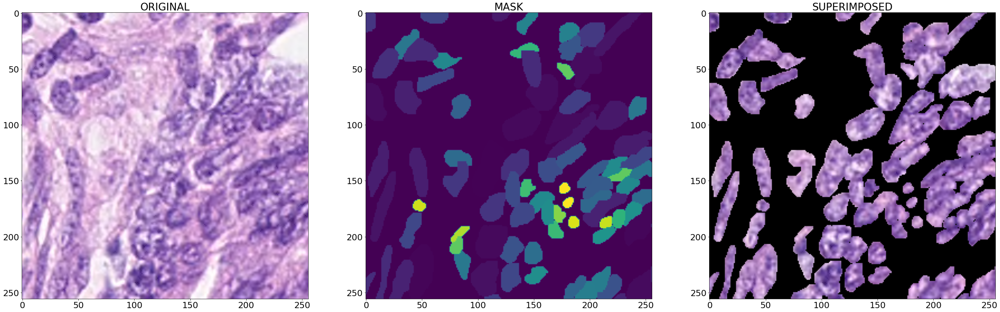

array([  0,   1,   2,   6,  11,  13,  19,  20,  22,  24,  25,  26,  28,
        37,  42,  45,  50,  51,  59,  62,  66,  67,  70,  75,  77,  84,
        94,  98,  99, 105, 108, 109, 110, 124, 126, 127, 129, 133, 147,
       148, 167, 168, 169, 170, 171, 177, 182, 188, 200, 203, 214, 216,
       225, 228, 247, 256, 270, 278, 282, 288, 313, 315, 316, 320, 338,
       341, 351, 356, 373, 377, 379, 385, 390, 393, 406, 412, 519, 531,
       542, 554, 598, 603, 604, 651, 702, 729, 738, 751, 791, 797],
      dtype=int16)

In [7]:
# Visualize masks and image patches for checking correctness
files = [file for file in writer_consep.database_dir.iterdir()]
visualize_db_patches(files[0].as_posix(), index=10)

# Pannuke

In [2]:
conf["dataset"]["args"]["dataset"] = "pannuke"
conf["patching_args"]["patch_size"] = 256
writer_pannuke = PatchWriter.from_conf(conf)

In [3]:
writer_pannuke.write_dbs()

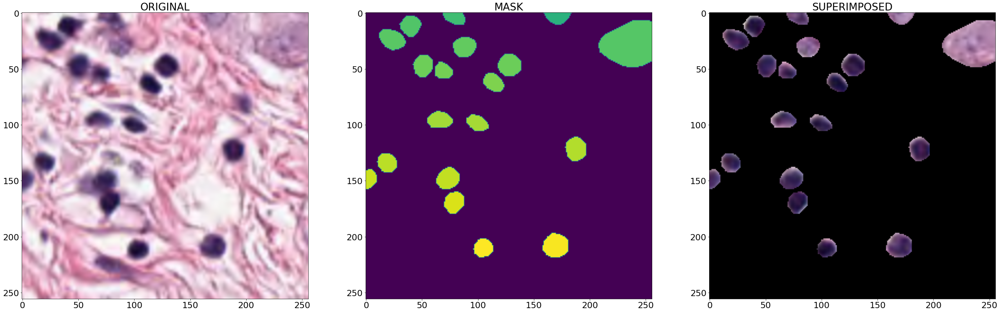

array([  0, 128, 139, 146, 147, 149, 152, 155, 156, 158, 161, 172, 173,
       177, 179, 182, 184, 189, 198, 200], dtype=int16)

In [4]:
files = [file for file in writer_pannuke.database_dir.iterdir()]
visualize_db_patches(files[1].as_posix(), index=921)

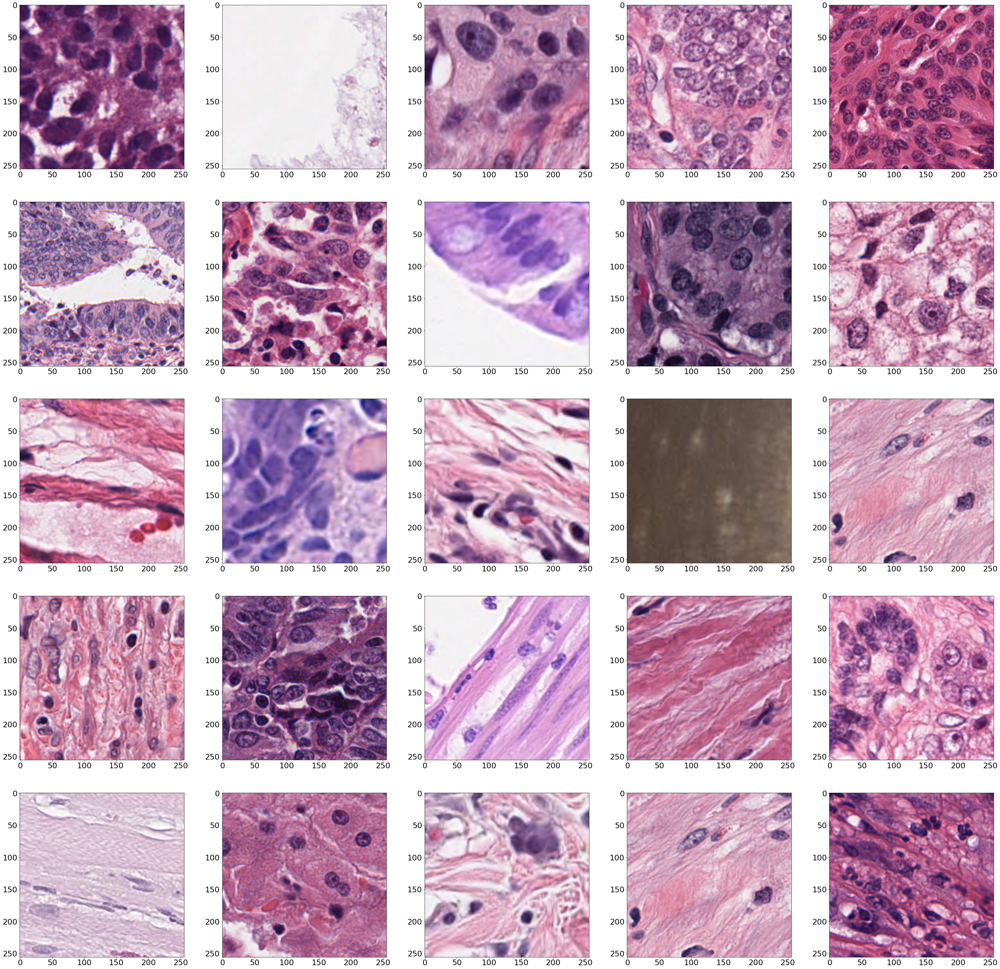

In [7]:
writer_pannuke.viz_patches_example(index=3, img_type="img", phase="test")